In [1]:
import pandas as pd
import datetime
import seaborn as sns
import requests
import kaggle
import matplotlib.pyplot as plt 
import numpy as np
from scipy import stats
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 150)

How do I download using requests / API? 
https://github.com/Kaggle/kaggle-api <br>
kaggle datasets download -d christophercorrea/dc-residential-properties <br> 

**General Exploration of the Data:**

In [2]:
#how do I not write the entire file path?
data = pd.read_csv('/Users/Julia/Desktop/bootcamp/dc_capstone/DC_Properties.csv', low_memory=False)
print(data.shape)
print(data.columns.tolist())
data.head()

(158957, 49)
['Unnamed: 0', 'BATHRM', 'HF_BATHRM', 'HEAT', 'AC', 'NUM_UNITS', 'ROOMS', 'BEDRM', 'AYB', 'YR_RMDL', 'EYB', 'STORIES', 'SALEDATE', 'PRICE', 'QUALIFIED', 'SALE_NUM', 'GBA', 'BLDG_NUM', 'STYLE', 'STRUCT', 'GRADE', 'CNDTN', 'EXTWALL', 'ROOF', 'INTWALL', 'KITCHENS', 'FIREPLACES', 'USECODE', 'LANDAREA', 'GIS_LAST_MOD_DTTM', 'SOURCE', 'CMPLX_NUM', 'LIVING_GBA', 'FULLADDRESS', 'CITY', 'STATE', 'ZIPCODE', 'NATIONALGRID', 'LATITUDE', 'LONGITUDE', 'ASSESSMENT_NBHD', 'ASSESSMENT_SUBNBHD', 'CENSUS_TRACT', 'CENSUS_BLOCK', 'WARD', 'SQUARE', 'X', 'Y', 'QUADRANT']


,Unnamed: 0,BATHRM,HF_BATHRM,HEAT,AC,NUM_UNITS,ROOMS,BEDRM,AYB,YR_RMDL,EYB,STORIES,SALEDATE,PRICE,QUALIFIED,SALE_NUM,GBA,BLDG_NUM,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,USECODE,LANDAREA,GIS_LAST_MOD_DTTM,SOURCE,CMPLX_NUM,LIVING_GBA,FULLADDRESS,CITY,STATE,ZIPCODE,NATIONALGRID,LATITUDE,LONGITUDE,ASSESSMENT_NBHD,ASSESSMENT_SUBNBHD,CENSUS_TRACT,CENSUS_BLOCK,WARD,SQUARE,X,Y,QUADRANT
0,0,4,0,Warm Cool,Y,2.0,8,4,1910.0,1988.0,1972,3.0,2003-11-25 00:00:00,1095000.0,Q,1,2522.0,1,3 Story,Row Inside,Very Good,Good,Common Brick,Metal- Sms,Hardwood,2.0,5,24,1680,2018-07-22 18:01:43,Residential,NaN,NaN,1748 SWANN STREET NW,WASHINGTON,DC,20009.0,18S UJ 23061 09289,38.914680,-77.040832,Old City 2,040 D Old City 2,4201.0,004201 2006,Ward 2,0152,-77.040429,38.914881,NW
1,1,3,1,Warm Cool,Y,2.0,11,5,1898.0,2007.0,1972,3.0,2000-08-17 00:00:00,NaN,U,1,2567.0,1,3 Story,Row Inside,Very Good,Good,Common Brick,Built Up,Hardwood,2.0,4,24,1680,2018-07-22 18:01:43,Residential,NaN,NaN,1746 SWANN STREET NW,WASHINGTON,DC,20009.0,18S UJ 23067 09289,38.914683,-77.040764,Old City 2,040 D Old City 2,4201.0,004201 2006,Ward 2,0152,-77.040429,38.914881,NW
2,2,3,1,Hot Water Rad,Y,2.0,9,5,1910.0,2009.0,1984,3.0,2016-06-21 00:00:00,2100000.0,Q,3,2522.0,1,3 Story,Row Inside,Very Good,Very Good,Common Brick,Built Up,Hardwood,2.0,4,24,1680,2018-07-22 18:01:43,Residential,NaN,NaN,1744 SWANN STREET NW,WASHINGTON,DC,20009.0,18S UJ 23074 09289,38.914684,-77.040678,Old City 2,040 D Old City 2,4201.0,004201 2006,Ward 2,0152,-77.040429,38.914881,NW
3,3,3,1,Hot Water Rad,Y,2.0,8,5,1900.0,2003.0,1984,3.0,2006-07-12 00:00:00,1602000.0,Q,1,2484.0,1,3 Story,Row Inside,Very Good,Good,Common Brick,Built Up,Hardwood,2.0,3,24,1680,2018-07-22 18:01:43,Residential,NaN,NaN,1742 SWANN STREET NW,WASHINGTON,DC,20009.0,18S UJ 23078 09288,38.914683,-77.040629,Old City 2,040 D Old City 2,4201.0,004201 2006,Ward 2,0152,-77.040429,38.914881,NW
4,4,2,1,Warm Cool,Y,1.0,11,3,1913.0,2012.0,1985,3.0,NaN,NaN,U,1,5255.0,1,3 Story,Semi-Detached,Very Good,Good,Common Brick,Neopren,Hardwood,1.0,0,13,2032,2018-07-22 18:01:43,Residential,NaN,NaN,1804 NEW HAMPSHIRE AVENUE NW,WASHINGTON,DC,20009.0,18S UJ 23188 09253,38.914383,-77.039361,Old City 2,040 D Old City 2,4201.0,004201 2006,Ward 2,0152,-77.040429,38.914881,NW


# DATA WRANGLING:

In [3]:
ddat = pd.DataFrame.drop(data, columns = 'Unnamed: 0')

In [4]:
#percentages of NaN values per column
def perc_nan(df):
    percnan=(df.isnull().sum(axis=0))/len(df)
    print(percnan)
perc_nan(ddat)

BATHRM                0.000000
HF_BATHRM             0.000000
HEAT                  0.000000
AC                    0.000000
NUM_UNITS             0.328774
ROOMS                 0.000000
BEDRM                 0.000000
AYB                   0.001705
YR_RMDL               0.490881
EYB                   0.000000
STORIES               0.329051
SALEDATE              0.168410
PRICE                 0.382122
QUALIFIED             0.000000
SALE_NUM              0.000000
GBA                   0.328774
BLDG_NUM              0.000000
STYLE                 0.328774
STRUCT                0.328774
GRADE                 0.328774
CNDTN                 0.328774
EXTWALL               0.328774
ROOF                  0.328774
INTWALL               0.328774
KITCHENS              0.328781
FIREPLACES            0.000000
USECODE               0.000000
LANDAREA              0.000000
GIS_LAST_MOD_DTTM     0.000000
SOURCE                0.000000
CMPLX_NUM             0.671226
LIVING_GBA            0.671226
FULLADDR

In [5]:
#delete NaN rows from X, Y, and ASSESSMENT_NBHD so we can use them as reference points for filling others
ddat = ddat.dropna(subset=['X', 'Y', 'ASSESSMENT_NBHD'])

In [6]:
#Are values the same for CITY and STATE?
print(ddat.CITY.value_counts())
print(ddat.STATE.value_counts())

WASHINGTON    105815
Name: CITY, dtype: int64
DC    105815
Name: STATE, dtype: int64


In [7]:
ddat = pd.DataFrame.drop(ddat, columns=['GIS_LAST_MOD_DTTM', 'BLDG_NUM', 'CMPLX_NUM', 'STATE', 'CITY', 'FULLADDRESS', 'NATIONALGRID'])
print(ddat.shape)

(158720, 41)


**Creating the dataset for price prediction:**

In [8]:
#We will make a small dataset, which contains no null values from price. 
sdat = ddat.dropna(subset=['PRICE'])
print(sdat.shape)

(98115, 41)


In [9]:
#if we remove all NaNs, we have no data.
nandat = sdat.dropna()
nandat.head()

,BATHRM,HF_BATHRM,HEAT,AC,NUM_UNITS,ROOMS,BEDRM,AYB,YR_RMDL,EYB,STORIES,SALEDATE,PRICE,QUALIFIED,SALE_NUM,GBA,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,USECODE,LANDAREA,SOURCE,LIVING_GBA,ZIPCODE,LATITUDE,LONGITUDE,ASSESSMENT_NBHD,ASSESSMENT_SUBNBHD,CENSUS_TRACT,CENSUS_BLOCK,WARD,SQUARE,X,Y,QUADRANT


In [10]:
#TWO LISTS OF COLUMNS. ONE CATEGORICAL, ONE NUMERICAL: catcol and numcol
#TWO corresponding dataframes: catdf and numdf

sdat.NUM_UNITS.astype('category')
catcol = []
numcol = []

for col in sdat.columns:
    if (sdat[col].dtype == object):
        catcol.append(col)
    if (sdat[col].dtype == np.int64) or (sdat[col].dtype == np.float64):
        numcol.append(col)
        
catdf = sdat[catcol].astype('category')
numdf = sdat[numcol].astype(np.float64)

print(catcol)
print(numcol)

['HEAT', 'AC', 'SALEDATE', 'QUALIFIED', 'STYLE', 'STRUCT', 'GRADE', 'CNDTN', 'EXTWALL', 'ROOF', 'INTWALL', 'SOURCE', 'ASSESSMENT_NBHD', 'ASSESSMENT_SUBNBHD', 'CENSUS_BLOCK', 'WARD', 'SQUARE', 'QUADRANT']
['BATHRM', 'HF_BATHRM', 'NUM_UNITS', 'ROOMS', 'BEDRM', 'AYB', 'YR_RMDL', 'EYB', 'STORIES', 'PRICE', 'SALE_NUM', 'GBA', 'KITCHENS', 'FIREPLACES', 'USECODE', 'LANDAREA', 'LIVING_GBA', 'ZIPCODE', 'LATITUDE', 'LONGITUDE', 'CENSUS_TRACT', 'X', 'Y']


**Outlier detection for numerical columns:**

In [11]:
#show information about values, outlier counts, and fences per numerical variable 
#this will assist in evaluating the revelence of an outlier calculated via quantile method
def show_outliers(df_in, col):
    q1 = df_in[col].quantile(0.25)
    q3 = df_in[col].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    df_out = df_in.loc[(df_in[col] < fence_low) | (df_in[col] > fence_high)]
    print(col)
    print("fence_low:", fence_low) 
    print("Q1:", q1)
    print("Q3:", q3) 
    print("fence_high:", fence_high)
    print("num_outliers:", len(df_out))
    print((df_in[col].value_counts().sort_index()))
    print('')
    print('')
#for col in numdf.columns:
    #show_outliers(numdf, col)

In [12]:
#some columns look skew. 
#Let's find a way to eliminate outliers without eliminating too much skew by adjusting fences. 
def perc_outliers(df_in, col, slow, shigh):
    q1 = df_in[col].quantile(0.25)
    q3 = df_in[col].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-slow*iqr
    fence_high = q3+shigh*iqr
    df_out = df_in.loc[(df_in[col] < fence_low) | (df_in[col] > fence_high)]
    print("Percentage of outliers:", len(df_out)/len(df_in))

In [13]:
stat, p = stats.shapiro(sdat.LIVING_GBA)
print('Statistic=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0).')
else:
    print('Sample does not look Gaussian (reject H0).')

Statistic=nan, p=1.000
Sample looks Gaussian (fail to reject H0).


/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/scipy/stats/morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Percentage of outliers: 0.016766039851195028
None


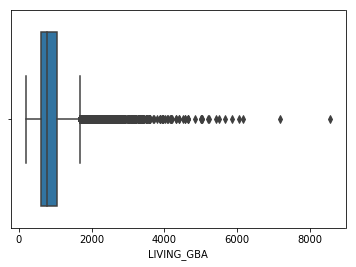

In [14]:
print(perc_outliers(sdat, 'LIVING_GBA', 1.5, 1.5))
sns.boxplot(x=sdat['LIVING_GBA'], whis=1.5)

/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


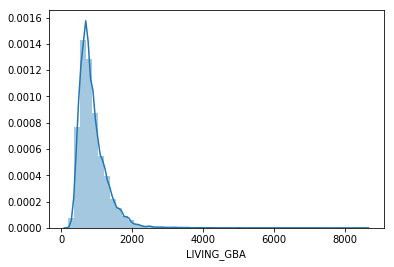

In [15]:
sns.distplot(sdat['LIVING_GBA'].dropna())

In [16]:
stat, p = stats.shapiro(sdat.GBA)
print('Statistic=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0).')
else:
    print('Sample does not look Gaussian (reject H0).')

Statistic=nan, p=1.000
Sample looks Gaussian (fail to reject H0).


/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/scipy/stats/morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Percentage of outliers: 0.035896651888090506
None


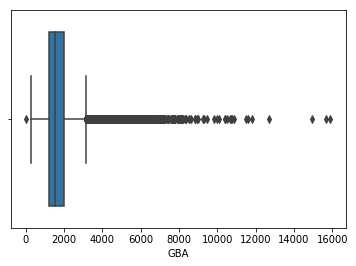

In [17]:
print(perc_outliers(sdat, 'GBA', 1.5, 1.5))
sns.boxplot(x=sdat['GBA'], whis=1.5)

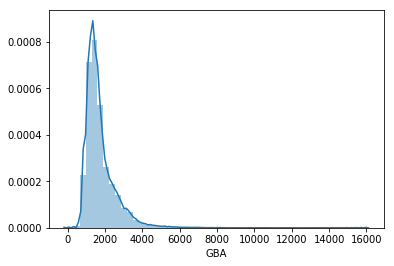

In [18]:
sns.distplot(sdat['GBA'].dropna())

In [19]:
stat, p = stats.shapiro(sdat.PRICE)
print('Statistic=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0).')
else:
    print('Sample does not look Gaussian (reject H0).')

Statistic=0.054, p=0.000
Sample does not look Gaussian (reject H0).


/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/scipy/stats/morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Percentage of outliers: 0.013626866432247873
None


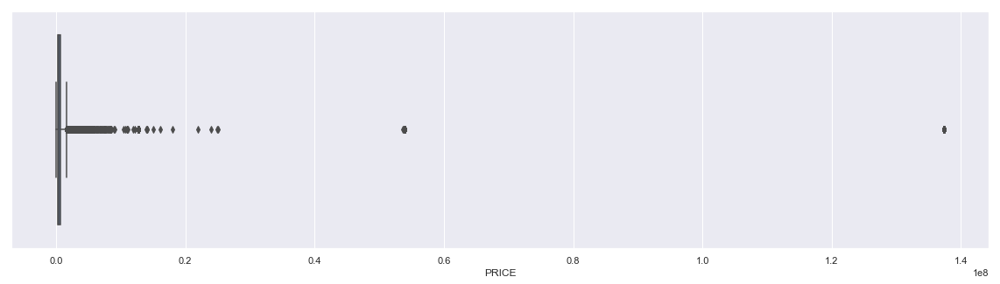

In [20]:
print(perc_outliers(sdat, 'PRICE', 1, 4.5))
sns.set()
plt.figure(figsize=(20, 5))
sns.boxplot(x=sdat['PRICE'], whis=2.5)

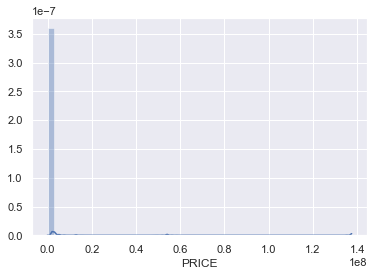

In [21]:
sns.distplot(sdat['PRICE'].dropna())

In [22]:
stat, p = stats.shapiro(sdat.LANDAREA)
print('Statistic=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0).')
else:
    print('Sample does not look Gaussian (reject H0).')

Statistic=0.593, p=0.000
Sample does not look Gaussian (reject H0).


/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/scipy/stats/morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


Percentage of outliers: 0.008673495388065026
None


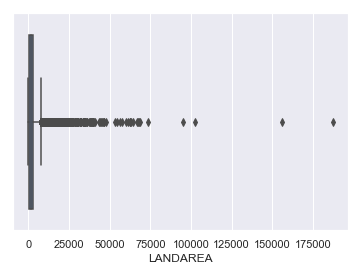

In [23]:
print(perc_outliers(sdat, 'LANDAREA', 1, 4.5))
sns.boxplot(x=sdat['LANDAREA'], whis=2.5)

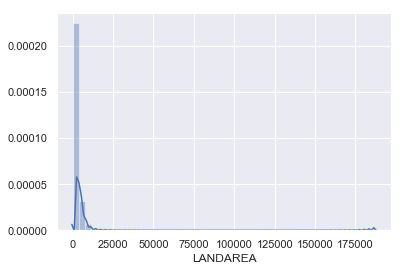

In [24]:
sns.distplot(sdat['LANDAREA'].dropna())

**Outlier detection for categorical data:**

In [25]:
#checking values for categorical data:
#for col in catdf.columns:
   # print(col) 
   # print(catdf[col].value_counts().sort_index())
   # print("")
   # print("")

**Removing outliers:**

In [26]:
#The only data that was likely faulty (and not just out of "the norm") was
#STORIES: 250.00, 275.00, 826.00        
#YR_RMDL: 20

odat2 = sdat.loc[((sdat['STORIES'] < 30) | (sdat['STORIES'].isna()))  & ((sdat['YR_RMDL'] >= 1880) | (sdat['YR_RMDL'].isna()))]

print(odat2.shape)

(98110, 41)


In [27]:
#Numerical:
#Create a list of all row indices matching outliers from specified columns.
takind = []
def remove_outliers (df_in, col, slow, shigh):
    q1 = df_in[col].quantile(0.25)
    q3 = df_in[col].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-slow*iqr
    fence_high = q3+shigh*iqr
    global iout
    iout = (df_in.loc[(df_in[col] < fence_low) | (df_in[col] > fence_high)]).index.tolist()
    for i in iout:
        if i not in takind:
            takind.append(i) 
    
remove_outliers(odat2, 'GBA', 1.5, 1.5)
remove_outliers(odat2, 'LIVING_GBA', 1.5, 1.5)
remove_outliers(odat2, 'LANDAREA', 1, 2.5)
remove_outliers(odat2, 'PRICE', 1, 2.5)
print(len(takind))

8356


In [28]:
#Remove those rows
odatd = odat2.drop(index=takind)
print(odatd.shape)

(89754, 41)


**Removing and replacing null values using location for fill value predictions:**

In [29]:
#percentage of missing data per row in new dataset
def missingdat(df):
    percnan=(df.isnull().sum(axis=0))/len(df)
    nulcolstat = percnan[percnan>0]
    nullist = (nulcolstat.index).tolist()
    nuldat = sdat[nullist]
    print(nulcolstat)
print(missingdat(odatd))

NUM_UNITS             0.422689
AYB                   0.001081
YR_RMDL               0.413486
STORIES               0.422967
SALEDATE              0.000011
GBA                   0.422689
STYLE                 0.422689
STRUCT                0.422689
GRADE                 0.422689
CNDTN                 0.422689
EXTWALL               0.422689
ROOF                  0.422689
INTWALL               0.422689
KITCHENS              0.422700
LIVING_GBA            0.577311
ASSESSMENT_SUBNBHD    0.195713
CENSUS_BLOCK          0.425864
dtype: float64
None


In [30]:
#create categorical and numerical dataframes
catcol = []
numcol = []
for col in odatd.columns:
    if (odatd[col].dtype == object):
        catcol.append(col)
    if (odatd[col].dtype == np.int64) or (odatd[col].dtype == np.float64):
        numcol.append(col)
catdf = odatd[catcol].astype('category')
numdf = odatd[numcol].astype(np.float64)

**Filling numerical nulls using mean values according to neighborhoods:**

In [31]:
odatd.columns

Index(['BATHRM', 'HF_BATHRM', 'HEAT', 'AC', 'NUM_UNITS', 'ROOMS', 'BEDRM',
       'AYB', 'YR_RMDL', 'EYB', 'STORIES', 'SALEDATE', 'PRICE', 'QUALIFIED',
       'SALE_NUM', 'GBA', 'STYLE', 'STRUCT', 'GRADE', 'CNDTN', 'EXTWALL',
       'ROOF', 'INTWALL', 'KITCHENS', 'FIREPLACES', 'USECODE', 'LANDAREA',
       'SOURCE', 'LIVING_GBA', 'ZIPCODE', 'LATITUDE', 'LONGITUDE',
       'ASSESSMENT_NBHD', 'ASSESSMENT_SUBNBHD', 'CENSUS_TRACT', 'CENSUS_BLOCK',
       'WARD', 'SQUARE', 'X', 'Y', 'QUADRANT'],
      dtype='object')

In [32]:
#NUM df with nulls:
numnulls = numdf.columns[numdf.isna().any()].tolist()
numnulldf = numdf[numnulls]
#NUM df without nulls:
numgooddf = numdf.drop(columns=numnulls)

In [33]:
#DF with means via neighborhood with WARD for grouping perspective. 
meandf= pd.DataFrame()
for col in numdf.columns:
    meandf[col] = (odatd.groupby(['WARD', 'ASSESSMENT_NBHD'])[col].apply(lambda x: x.mean()))
meandf.head(10)

BATHRM  HF_BATHRM  NUM_UNITS     ROOMS     BEDRM  \
WARD   ASSESSMENT_NBHD                                                        
Ward 1 Columbia Heights  1.736582   0.285134   1.298188  5.264477  2.447387   
       Kalorama          1.385724   0.177763   1.620690  3.888813  1.527797   
       Ledroit Park      1.915119   0.533156   1.247525  6.005305  3.002653   
       Mt. Pleasant      1.768526   0.328877   1.425799  5.069519  2.301757   
       Old City 2        1.718646   0.366260   1.292546  5.174251  2.164817   
Ward 2 Burleith          2.403302   0.580189   1.090047  7.235849  3.323113   
       Central-tri 1     1.355087   0.154162   1.988506  3.759507  1.282631   
       Central-tri 3     1.293643   0.124622        NaN  3.399596  1.201816   
       Foggy Bottom      1.200692   0.155709   1.151515  3.237601  0.957324   
       Georgetown        1.845937   0.512980   1.097983  5.513544  2.340293   

                                 AYB      YR_RMDL          EYB   STORIES  \
WARD   ASSESSMENT_NBHD                                                     
Ward 1 Columbia Heights  1934.719965  2006.705225  1958.864230  2.195016   
       Kalorama          1922.670337  1989.866332  1925.680851  2.635057   
       Ledroit Park      1917.562334  2007.490842  1961.952255  2.211221   
       Mt. Pleasant      1940.603976  2001.554069  1958.829259  2.422945   
       Old City 2        1953.441176  2002.021595  1969.894007  2.327707   
Ward 2 Burleith          1946.103774  2000.152284  1976.146226  2.182464   
       Central-tri 1     1969.738952  1988.458002  1969.083248  2.554598   
       Central-tri 3     2000.330979  2005.693069  2000.306256       NaN   
       Foggy Bottom      1957.430219  1984.201923  1964.439446  2.250000   
       Georgetown        1925.541502  1993.651226  1967.435102  2.272719   

                                 PRICE  SALE_NUM          GBA  KITCHENS  \
WARD   ASSESSMENT_NBHD                                                    
Ward 1 Columbia Heights  438919.636299  1.858581  1609.806013  1.345964   
       Kalorama          459430.100892  1.882636  2393.839080  1.747126   
       Ledroit Park      468040.856764  1.806366  1554.864686  1.280528   
       Mt. Pleasant      551102.723453  1.899924  1951.417808  1.447489   
       Old City 2        574502.722531  1.934517  1583.151899  1.299578   
Ward 2 Burleith          856860.976415  1.837264  1673.270142  1.132701   
       Central-tri 1     484152.785714  1.804728  2000.850575  1.988506   
       Central-tri 3     502523.294147  1.910192          NaN       NaN   
       Foggy Bottom      342703.424452  1.717416  1333.530303  1.181818   
       Georgetown        757792.980248  1.932280  1597.109510  1.162344   

                         FIREPLACES    USECODE     LANDAREA   LIVING_GBA  \
WARD   ASSESSMENT_NBHD                                                     
Ward 1 Columbia Heights    0.208686  15.418432  1039.873941   837.140915   
       Kalorama            0.404255  16.568977   485.025395   808.086131   
       Ledroit Park        0.432361  14.405836  1427.307692   809.797297   
       Mt. Pleasant        0.429717  15.978228  1011.334989   870.839839   
       Old City 2          0.410100  15.677580   686.937847   910.971586   
Ward 2 Burleith            1.018868  11.841981  2205.502358  1688.500000   
       Central-tri 1       0.257451  16.996917   258.365879   806.090909   
       Central-tri 3       0.029768  16.995459   102.274470   860.033804   
       Foggy Bottom        1.302191  16.431373   286.497116   633.885714   
       Georgetown          0.931151  14.089165  1083.559819   946.009576   

                              ZIPCODE   LATITUDE  LONGITUDE  CENSUS_TRACT  \
WARD   ASSESSMENT_NBHD                                                      
Ward 1 Columbia Heights  20008.204802  38.928485 -77.028694   3220.106638   
       Kalorama          20009.000000  38.919409 -77.044936   4001.459849   
       Ledroit Park      20001.000000  38.9

In [34]:
#Finding missing data in meandf:
nulmeancol = meandf.columns[meandf.isnull().any()]
nulmeanind = (meandf[meandf.isnull().any(axis=1)]).index.tolist()
print(nulmeancol)
print("")
print(nulmeanind)
#meandf[nulmeancol]

Index(['NUM_UNITS', 'STORIES', 'GBA', 'KITCHENS', 'LIVING_GBA'], dtype='object')

[('Ward 2', 'Central-tri 3'), ('Ward 3', 'Foxhall'), ('Ward 3', 'Kent'), ('Ward 3', 'Massachusetts Avenue Heights'), ('Ward 3', 'Woodley'), ('Ward 4', 'Chevy Chase'), ('Ward 4', 'Colonial Village'), ('Ward 4', 'Crestwood'), ('Ward 4', 'Hawthorne'), ('Ward 4', 'Riggs Park'), ('Ward 4', 'Shepherd Heights'), ('Ward 5', 'Michigan Park'), ('Ward 5', 'Riggs Park'), ('Ward 7', 'Anacostia')]


In [35]:
#Filling missing data in central tri-3 with data from central tri-1:
fillcols = meandf.columns[(meandf.loc[('Ward 2', 'Central-tri 3')].isnull())]
meandf.loc[('Ward 2', 'Central-tri 3'), fillcols] = meandf.loc[('Ward 2', 'Central-tri 1'), fillcols]

In [36]:
#Filling the rest of meandf with means of Wards. 
for col in meandf:
    meandf[col] = meandf[col].transform(lambda x: x.fillna(x.mean()))

In [37]:
#prepare df to use as dict to fill NaNs:
meandf = meandf.reset_index(level='WARD')

In [38]:
#filling missing numerical data
numfilleddf = pd.DataFrame()
numdf2 = pd.concat([numdf, odatd['ASSESSMENT_NBHD']], axis=1).astype('category')
for col in numnulldf.columns:
    #get index of missing values
    colindex = numdf2[numdf2[col].isnull()].index.tolist()
    #generate mean dictionary
    coldict = dict(zip(meandf.index, meandf[col])) 
    #corresponding neighborhood list from df
    nlist = []
    for i in colindex:
        nlist.append(numdf2.loc[i, 'ASSESSMENT_NBHD'])           
    #fill nans
    for i, n in zip(colindex, nlist):
        filler = coldict[n]
        if filler not in numdf2[col].cat.categories:
            numdf2[col] = numdf2[col].cat.add_categories([filler])
        numfilleddf[col] = numdf2[col].fillna(filler)

**Filling categorical null values using mode values according to neighborhoods:**

In [39]:
#CAT df with nulls 
catnulls = catdf.columns[catdf.isna().any()].tolist()
catnulldf = catdf[catnulls]
#CAT df without nulls 
catgooddf = catdf.drop(columns=catnulls)

In [40]:
#Df with mode values. 
modedf = pd.DataFrame()
for col in catdf.columns:
    modedf[col] = odatd.groupby('ASSESSMENT_NBHD')[col].apply(lambda x: x.mode())
modedf.head()

,,HEAT,AC,SALEDATE,QUALIFIED,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,SOURCE,ASSESSMENT_NBHD,ASSESSMENT_SUBNBHD,CENSUS_BLOCK,WARD,SQUARE,QUADRANT
ASSESSMENT_NBHD,,,,,,,,,,,,,,,,,,,
16th Street Heights,0,Hot Water Rad,Y,2016-08-18 00:00:00,Q,2 Story,Single,Good Quality,Good,Common Brick,Metal- Sms,Hardwood,Residential,16th Street Heights,049 A 16th Street Heights,002001 2010,Ward 4,2798,NW
American University,0,Warm Cool,Y,2005-09-30 00:00:00,Q,2 Story,Single,Good Quality,Good,Common Brick,Slate,Hardwood,Residential,American University,001 B American University,001001 1013,Ward 3,1730,NW
Anacostia,0,Forced Air,Y,2013-07-16 00:00:00,Q,2 Story,Row Inside,Average,Average,Common Brick,Metal- Sms,Hardwood,Residential,Anacostia,002 B Anacostia,007504 1004,Ward 8,5807,SE
Barry Farms,0,Forced Air,Y,2006-02-08 00:00:00,Q,2 Story,Row Inside,Average,Average,Common Brick,Built Up,Hardwood,Condominium,Barry Farms,NaN,007407 2008,Ward 8,5869,SE
Berkley,0,Warm Cool,Y,2014-06-27 00:00:00,Q,2 Story,Single,Very Good,Good,Common Brick,Comp Shingle,Hardwood,Residential,Berkley,004 A Berkley,000802 1001,Ward 3,1368,NW


In [41]:
#Filling NaNs in mode df:

#find which groups have no subneighborhoods assigned
subindex = modedf[modedf['ASSESSMENT_SUBNBHD'].isnull()].index.tolist()

#get neighborhoods for each of those groups:
subnlist = []
for num in subindex:
    subnlist.append(modedf.loc[num, 'ASSESSMENT_NBHD'])
    
#assign neighborhood name to subneighborhood name:
fillvals = []
for i, val in zip(subindex, subnlist):
    modedf.loc[i, 'ASSESSMENT_SUBNBHD'] = val

In [42]:
#filling Central-tri 3 data with central-tri 1 data
print((modedf[modedf.isnull().any(axis=1)]).index.tolist())
modedf = modedf.fillna(method='ffill')

[('Central-tri 3', 0)]


In [43]:
#filling missing categorical data

catfilleddf = pd.DataFrame()
catdf2 = catdf
for col in catnulldf.columns:
    #get index of missing values
    colindex = catdf2[catdf2[col].isnull()].index.tolist()
    #generate mode dictionary
    coldict = dict(zip(modedf['ASSESSMENT_NBHD'], modedf[col])) 
    #corresponding neighborhood list from df
    nlist = []
    for i in colindex:
        nlist.append(catdf2.loc[i, 'ASSESSMENT_NBHD'])           
    #fill nans
    for i, n in zip(colindex, nlist):
        filler = coldict[n]
        if filler not in catdf2[col].cat.categories:
            catdf2[col] = catdf2[col].cat.add_categories([filler])
        catfilleddf[col] = catdf2[col].fillna(filler)

**Creating final dataframe by joining filled categorical and numerical dataframes:**

In [44]:
finaldf = (pd.concat([catgooddf, catfilleddf, numgooddf, numfilleddf], axis=1))
print(finaldf.shape)
print(missingdat(finaldf))

#create new bathrms column
BATHRMS = finaldf.BATHRM + .5*(finaldf.HF_BATHRM)
finaldf['BATHRMS'] = BATHRMS 

finaldf

(89754, 41)
Series([], dtype: float64)
None


,HEAT,AC,QUALIFIED,SOURCE,ASSESSMENT_NBHD,WARD,SQUARE,QUADRANT,SALEDATE,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,ASSESSMENT_SUBNBHD,CENSUS_BLOCK,BATHRM,HF_BATHRM,ROOMS,BEDRM,EYB,PRICE,SALE_NUM,FIREPLACES,USECODE,LANDAREA,ZIPCODE,LATITUDE,LONGITUDE,CENSUS_TRACT,X,Y,NUM_UNITS,AYB,YR_RMDL,STORIES,GBA,KITCHENS,LIVING_GBA,BATHRMS
0,Warm Cool,Y,Q,Residential,Old City 2,Ward 2,0152,NW,2003-11-25 00:00:00,3 Story,Row Inside,Very Good,Good,Common Brick,Metal- Sms,Hardwood,040 D Old City 2,004201 2006,4.0,0.0,8.0,4.0,1972.0,1095000.0,1.0,5.0,24.0,1680.0,20009.0,38.914680,-77.040832,4201.0,-77.040429,38.914881,2.000000,1910.0,1988.000000,3.000000,2522.000000,2.000000,723.172363,4.0
3,Hot Water Rad,Y,Q,Residential,Old City 2,Ward 2,0152,NW,2006-07-12 00:00:00,3 Story,Row Inside,Very Good,Good,Common Brick,Built Up,Hardwood,040 D Old City 2,004201 2006,3.0,1.0,8.0,5.0,1984.0,1602000.0,1.0,3.0,24.0,1680.0,20009.0,38.914683,-77.040629,4201.0,-77.040429,38.914881,2.000000,1900.0,2003.000000,3.000000,2484.000000,2.000000,723.172363,3.5
7,Hot Water Rad,Y,Q,Residential,Old City 2,Ward 2,0152,NW,2011-09-29 00:00:00,3 Story,Row Inside,Very Good,Average,Common Brick,Metal- Sms,Hardwood,040 D Old City 2,004201 2005,3.0,1.0,8.0,4.0,1972.0,1050000.0,1.0,1.0,24.0,1627.0,20009.0,38.915408,-77.040129,4201.0,-77.040429,38.914881,2.000000,1906.0,2011.000000,3.000000,2401.000000,2.000000,723.172363,3.5
8,Warm Cool,Y,Q,Residential,Old City 2,Ward 2,0152,NW,2018-05-03 00:00:00,2 Story,Row Inside,Above Average,Very Good,Common Brick,Built Up,Hardwood,040 D Old City 2,004201 2005,3.0,1.0,7.0,3.0,1967.0,1430000.0,4.0,1.0,24.0,1424.0,20009.0,38.915017,-77.039903,4201.0,-77.040429,38.914881,2.000000,1908.0,2008.000000,2.000000,1488.000000,2.000000,723.172363,3.5
14,Warm Cool,Y,Q,Residential,Old City 2,Ward 2,0152,NW,2011-09-30 00:00:00,2 Story,Row Inside,Above Average,Very Good,Stucco,Metal- Sms,Hardwood,040 D Old City 2,004201 2005,3.0,1.0,5.0,3.0,1967.0,1325000.0,1.0,1.0,24.0,1815.0,20009.0,38.915038,-77.039716,4201.0,-77.040429,38.914881,2.000000,1917.0,2000.000000,2.000000,2692.000000,2.000000,723.172363,3.5
16,Warm Cool,Y,Q,Residential,Old City 2,Ward 2,0152,NW,2010-11-04 00:00:00,2 Story,Row Inside,Above Average,Very Good,Common Brick,Metal- Sms,Hardwood,040 D Old City 2,004201 2005,3.0,1.0,8.0,3.0,1967.0,1240000.0,1.0,0.0,11.0,1424.0,20009.0,38.915018,-77.039844,4201.0,-77.040429,38.914881,1.000000,1908.0,2006.000000,2.000000,1662.000000,1.000000,723.172363,3.5
19,Hot Water Rad,Y,Q,Residential,Old City 2,Ward 2,0152,NW,2001-07-23 00:00:00,2 Story,Row Inside,Good Quality,Good,Common Brick,Built Up,Hardwood,040 D Old City 2,004201 2005,3.0,1.0,9.0,3.0,1969.0,592250.0,1.0,1.0,24.0,1424.0,20009.0,38.915019,-77.040138,4201.0,-77.040429,38.914881,2.000000,1908.0,2013.000000,2.000000,1598.000000,2.000000,723.172363,3.5
22,Forced Air,Y,Q,Residential,Old City 2,Ward 2,0208,NW,2006-01-09 00:00:00,2 Story,Semi-Detached,Above Average,Good,Common Brick,Built Up,Hardwood,040 E Old City 2,005201 4003,1.0,0.0,6.0,3.0,1967.0,907400.0,1.0,0.0,13.0,2090.0,20009.0,38.911368,-77.033925,5201.0,-77.033366,38.911716,1.000000,1880.0,2010.000000,2.000000,1790.000000,1.000000,723.172363,1.0
23,Forced Air,Y,Q,Residential,Old City 2,Ward 2,0208,NW,2012-08-21 00:00:00,2 Story,Semi-Detached,Above Average,Very Good,Common Brick,Built Up,Hardwood,040 E Old City 2,005201 4003,2.0,1.0,5.0,3.0,1984.0,1065000.0,1.0,1.0,13.0,2090.0,20009.0,38.911368,-77.033972,5201.0,-77.033366,38.911716,1.000000,1880.0,2010.000000,2.000000,1600.000000,1.000000,723.172363,2.5
24,Hot Water Rad,Y,Q,Residential,Old City 2,Ward 2,0208,NW,2012-07-25 00:00:00,2 Story,Single,Above Average,Good,Common Brick,Built Up,Hardwood,040 E Old City 2,005201 4003,2.0,1.0,8.0,3.0,1967.0,1100000.0,1.0,2.0,12.0,2090.0,20009.0,38.911319,-77.034070,5201.0,-77.033366,38.911716,1.000000,1880.0,2004.000000,2.000000,1958.000000,1.000000,723.172363,2.5


In [45]:
finaldf = finaldf.rename(index=str, columns={"ASSESSMENT_NBHD": "NBHD", "ASSESSMENT_SUBNBHD": "SUBNBHD", "SOURCE": "TYPE", 
                                   "SALEDATE": "SALE_DATE", "EYB": "YR_EXT", "AYB": "YR_ORIGIN", "LIVING_GBA": "GBA_LIVING", 
                                    "NUM_UNITS": "UNITS", "NUM_ROOMS": "ROOMS", "BEDRM": "BEDRMS"})
finaldf = finaldf.loc[:, ['PRICE', 'SALE_DATE', 'SALE_NUM', 'QUALIFIED', 
'QUADRANT', 'WARD', 'SQUARE', 'NBHD', 'SUBNBHD', 'CENSUS_TRACT', 'CENSUS_BLOCK', 'ZIPCODE', 'LATITUDE', 'LONGITUDE', 'X', 'Y', 
'STYLE', 'STRUCT', 'USECODE', 'UNITS', 'STORIES', 'GRADE', 'CNDTN', 
'LANDAREA', 'GBA', 'GBA_LIVING',
'YR_ORIGIN', 'YR_EXT', 'YR_RMDL',
'ROOMS', 'BEDRMS', 'BATHRMS', 'KITCHENS', 
'HEAT', 'AC', 'FIREPLACES', 'ROOF', 'INTWALL', 'EXTWALL']]

#cleaning up for graphing:
finaldf.UNITS = finaldf['UNITS'].round()
finaldf.KITCHENS = finaldf['KITCHENS'].round()
finaldf.STORIES = finaldf['STORIES'].round()
finaldf = finaldf[finaldf.STRUCT != 'Default']
finaldf.drop(['X', 'Y'], axis=1) #these are duplicates of latitutde and longitude

finaldf.head()

,PRICE,SALE_DATE,SALE_NUM,QUALIFIED,QUADRANT,WARD,SQUARE,NBHD,SUBNBHD,CENSUS_TRACT,CENSUS_BLOCK,ZIPCODE,LATITUDE,LONGITUDE,X,Y,STYLE,STRUCT,USECODE,UNITS,STORIES,GRADE,CNDTN,LANDAREA,GBA,GBA_LIVING,YR_ORIGIN,YR_EXT,YR_RMDL,ROOMS,BEDRMS,BATHRMS,KITCHENS,HEAT,AC,FIREPLACES,ROOF,INTWALL,EXTWALL
0,1095000.0,2003-11-25 00:00:00,1.0,Q,NW,Ward 2,0152,Old City 2,040 D Old City 2,4201.0,004201 2006,20009.0,38.914680,-77.040832,-77.040429,38.914881,3 Story,Row Inside,24.0,2.0,3.0,Very Good,Good,1680.0,2522.0,723.172363,1910.0,1972.0,1988.0,8.0,4.0,4.0,2.0,Warm Cool,Y,5.0,Metal- Sms,Hardwood,Common Brick
3,1602000.0,2006-07-12 00:00:00,1.0,Q,NW,Ward 2,0152,Old City 2,040 D Old City 2,4201.0,004201 2006,20009.0,38.914683,-77.040629,-77.040429,38.914881,3 Story,Row Inside,24.0,2.0,3.0,Very Good,Good,1680.0,2484.0,723.172363,1900.0,1984.0,2003.0,8.0,5.0,3.5,2.0,Hot Water Rad,Y,3.0,Built Up,Hardwood,Common Brick
7,1050000.0,2011-09-29 00:00:00,1.0,Q,NW,Ward 2,0152,Old City 2,040 D Old City 2,4201.0,004201 2005,20009.0,38.915408,-77.040129,-77.040429,38.914881,3 Story,Row Inside,24.0,2.0,3.0,Very Good,Average,1627.0,2401.0,723.172363,1906.0,1972.0,2011.0,8.0,4.0,3.5,2.0,Hot Water Rad,Y,1.0,Metal- Sms,Hardwood,Common Brick
8,1430000.0,2018-05-03 00:00:00,4.0,Q,NW,Ward 2,0152,Old City 2,040 D Old City 2,4201.0,004201 2005,20009.0,38.915017,-77.039903,-77.040429,38.914881,2 Story,Row Inside,24.0,2.0,2.0,Above Average,Very Good,1424.0,1488.0,723.172363,1908.0,1967.0,2008.0,7.0,3.0,3.5,2.0,Warm Cool,Y,1.0,Built Up,Hardwood,Common Brick
14,1325000.0,2011-09-30 00:00:00,1.0,Q,NW,Ward 2,0152,Old City 2,040 D Old City 2,4201.0,004201 2005,20009.0,38.915038,-77.039716,-77.040429,38.914881,2 Story,Row Inside,24.0,2.0,2.0,Above Average,Very Good,1815.0,2692.0,723.172363,1917.0,1967.0,2000.0,5.0,3.0,3.5,2.0,Warm Cool,Y,1.0,Metal- Sms,Hardwood,Stucco


### For data exploration, we can think of the columns in categories:

**Sales:**
-  PRICE
-  SALE_DATE
-  SALE_NUM
-  QUALIFIED <br>

**Location:**
-  QUADRANT
-  WARD
-  SQUARE
-  ASSESSMENT_NBHD
-  ASSESSMENT_SUBNBHD
-  CENSUS_TRACT
-  CENSUS_BLOCK
-  ZIPCODE
-  LATITUDE
-  LONGITUDE
-  X
-  Y  <br>

**Structures:**
-  STYLE
-  STRUCT
-  USECODE
-  UNITS
-  STORIES
-  GRADE
-  CNDTN <br>

**Areas:**
-  LANDAREA
-  GBA (gross building area)
-  GBA_LIVING <br> 

**Timeline:**
-  YR_ORIGIN (year original structure was built)
-  YR_EXT (year improvements were built)
-  YR_RMDL <br>

**Rooms:**
-  ROOMS
-  KITCHENS
-  BATHRMS
-  BEDRMS 

**Qualities:** 
-  HEAT
-  AC
-  FIREPLACES
-  INTWALL
-  ROOF
-  EXTWALL 

**Concatenating with data from census tracts:**

In [46]:
census1 = pd.read_csv("/Users/Julia/Desktop/bootcamp/dc_capstone/census_tracts_2010.csv")
census1 = census1.rename(index=str, columns = {'P0010001': 'POP', 'P0010002': 'POP_ONE_RACE', 'P0010003': 'WHITE',
       'P0010004': 'BLACK', 'P0010005': 'NTV_AMR', 'P0010006': 'ASIAN', 'P0010007': 'PAC_ISL', 'P0010008': 'OTHER', 'OP000001': 'BLACK+',
       'OP000002': 'NTV_AMR+', 'OP000003': 'ASN+', 'OP000004': 'PAC_ISL+', 'P0020002': 'HISP', 'P0020005': 'WHITE_NONHISP', 'P0020006': 'BLACK_NONHISP',
       'P0020007': 'NTV_AMR_NONHISP', 'P0020008': 'ASIAN_NONHISP', 'P0020009': 'PAC_ISL_NONHISP', 'P0020010': 'OTHER_NONHISP', 'OP00005': 'BLACK+_NONHISP', 'OP00006': 'NTV_AMR+_NONHISP',
       'OP00007': 'ASIAN+_NONHISP', 'OP00008': 'PAC_ISL+_NONHISP', 'P0030001': 'ADULT', 'P0030003': 'WHITE_ADULT', 'P0030004': 'BLACK_ADULT', 'P0030005': 'NTV_AMR_ADULT',
       'P0030006': 'ASIAN_ADULT', 'P0030007': 'PAC_ISL_ADULT', 'P0030008': 'OTHER_ADULT', 'OP00009': 'BLACK+_ADULT', 'OP00010': 'NTV_AMR+_ADULT', 'OP00011': 'ASIAN+_ADULT',
       'OP00012': 'PAC_ISL+_ADULT', 'P0040002': 'HISP_ADULT', 'P0040005': 'WHITE_NONHISP_ADULT', 'P0040006': 'BLACK_NONHISP_ADULT', 'P0040007': 'NTV_AMR_NONHISP_ADULT', 'P0040008': 'ASIAN_NONHISP_ADULT',
       'P0040009': 'PAC_ISL_NONHISP_ADULT', 'P0040010': 'OTHER_NONHISP_ADULT', 'OP000013': 'BLACK+_NONHISP_ADULT', 'OP000014': 'NTV_AMR+_NONHISP_ADULT', 'OP000015': 'ASIAN+_NONHISP_ADULT', 'OP000016': 'PAC_ISL+_NONHISP_ADULT',
       'H0010001': 'UNITS', 'H0010002': 'OCCUPIED_UNITS', 'H0010003': 'VACANT_UNITS'})
census = census1.loc[:, ['TRACT', 'POP', 'POP_ONE_RACE', 'WHITE', 'BLACK', 'NTV_AMR', 'ASIAN', 'PAC_ISL', 'HISP', 'OTHER', 'FAGI_TOTAL_2010',
       'FAGI_MEDIAN_2010', 'FAGI_TOTAL_2013', 'FAGI_MEDIAN_2013',
       'FAGI_TOTAL_2011', 'FAGI_MEDIAN_2011', 'FAGI_TOTAL_2012',
       'FAGI_MEDIAN_2012', 'FAGI_TOTAL_2014', 'FAGI_MEDIAN_2014',
       'FAGI_TOTAL_2015', 'FAGI_MEDIAN_2015', 'UNITS', 'OCCUPIED_UNITS', 'VACANT_UNITS',
       'ACRES', 'SQ_MILES',]]     
census_full = census1.loc[:, ['TRACT', 'POP', 'POP_ONE_RACE', 'WHITE', 'BLACK', 'NTV_AMR', 'ASIAN', 'PAC_ISL', 'HISP','OTHER', 'BLACK+', 'NTV_AMR+', 'ASN+', 'PAC_ISL+',
        'WHITE_NONHISP', 'BLACK_NONHISP', 'NTV_AMR_NONHISP', 'ASIAN_NONHISP', 'PAC_ISL_NONHISP', 'OTHER_NONHISP',
        'BLACK+_NONHISP', 'NTV_AMR+_NONHISP', 'ASIAN+_NONHISP', 'PAC_ISL+_NONHISP', 
        'ADULT', 'WHITE_ADULT', 'BLACK_ADULT', 'NTV_AMR_ADULT', 'ASIAN_ADULT', 'PAC_ISL_ADULT', 'OTHER_ADULT'
        'BLACK+_NONHISP_ADULT', 'NTV_AMR+_NONHISP_ADULT', 'ASIAN+_NONHISP_ADULT', 'PAC_ISL+_NONHISP_ADULT',
        'FAGI_TOTAL_2010',
       'FAGI_MEDIAN_2010', 'FAGI_TOTAL_2013', 'FAGI_MEDIAN_2013',
       'FAGI_TOTAL_2011', 'FAGI_MEDIAN_2011', 'FAGI_TOTAL_2012',
       'FAGI_MEDIAN_2012', 'FAGI_TOTAL_2014', 'FAGI_MEDIAN_2014',
       'FAGI_TOTAL_2015', 'FAGI_MEDIAN_2015', 'UNITS', 'OCCUPIED_UNITS', 'VACANT_UNITS',
       'ACRES', 'SQ_MILES','Shape_Length', 'Shape_Area']]   
                
census.head()

/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/pandas/core/indexing.py:1472: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


,TRACT,POP,POP_ONE_RACE,WHITE,BLACK,NTV_AMR,ASIAN,PAC_ISL,HISP,OTHER,FAGI_TOTAL_2010,FAGI_MEDIAN_2010,FAGI_TOTAL_2013,FAGI_MEDIAN_2013,FAGI_TOTAL_2011,FAGI_MEDIAN_2011,FAGI_TOTAL_2012,FAGI_MEDIAN_2012,FAGI_TOTAL_2014,FAGI_MEDIAN_2014,FAGI_TOTAL_2015,FAGI_MEDIAN_2015,UNITS,OCCUPIED_UNITS,VACANT_UNITS,ACRES,SQ_MILES
0,3400,4347,4152,576,3392,20,97,3,239,64,53344073.0,39287.0,75037699.0,43117.0,59287920.0,38099.0,70436558.0,40413.0,79636907.0,42596.0,92096567.0,46152.0,1347,1025,322,266.264201,0.416038
1,3500,3740,3594,626,2681,14,106,0,371,167,46454657.0,30673.5,66239783.0,32859.5,55914150.0,30555.5,60909648.0,32885.0,78873551.0,40450.0,97549566.0,44843.0,1189,964,225,94.352383,0.147426
2,3600,4208,4048,1773,1645,13,161,0,809,456,110621750.0,35858.0,161376203.0,42788.5,147954698.0,40355.0,153247476.0,40692.0,143081526.0,41616.0,178040405.0,46806.0,2308,1987,321,75.521648,0.118003
3,3700,5763,5507,1915,2527,22,212,10,1514,821,103905996.0,32263.0,162058134.0,41387.5,126923023.0,35705.5,143596631.0,38248.0,140501730.0,39131.0,181651966.0,45690.5,2570,2401,169,72.231863,0.112862
4,3800,4614,4419,2884,825,22,261,1,935,426,155960140.0,48799.0,209040361.0,54786.0,196678623.0,52077.0,213601983.0,54908.0,213544242.0,56380.0,235619338.0,60561.0,2861,2625,236,87.921652,0.137378


In [47]:
finaldf.CENSUS_TRACT = (finaldf.CENSUS_TRACT).apply(np.int64)

In [48]:
finaldf
mergedf = pd.merge(finaldf, census, left_on=finaldf.CENSUS_TRACT, right_on=census.TRACT, how='inner')
mergedf = mergedf.drop(['CENSUS_TRACT'], axis=1)

In [49]:
census.to_csv('/Users/Julia/Desktop/bootcamp/dc_capstone/censusdf.csv', index=False)
finaldf.to_csv('/Users/Julia/Desktop/bootcamp/dc_capstone/finaldf.csv', index=False)
mergedf.to_csv('/Users/Julia/Desktop/bootcamp/dc_capstone/mergedf.csv', index=False)

# DATA STORY:

### A map of DC showing ward locations for sales:

Text(0.5, 1.0, 'LOCATION OF REAL ESTATE SALES, 1992-2018')

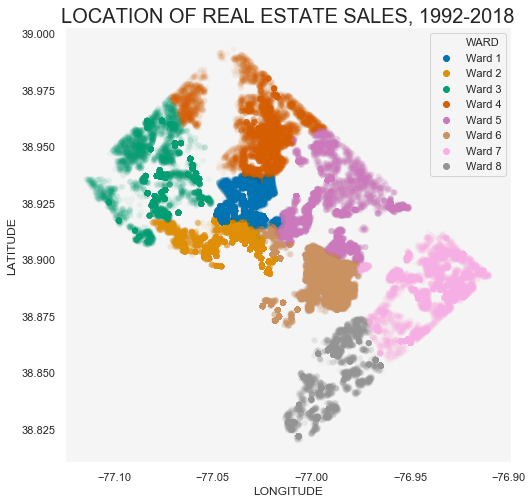

In [52]:
#convert date to year
df = finaldf
df.SALE_DATE = df.SALE_DATE.astype("datetime64")

start_date= '01-01-1992'
end_date = '12-31-2018'
mask = (df.SALE_DATE >= start_date) & (df.SALE_DATE <= end_date)
gendf = df.loc[mask]

cat_type = pd.api.types.CategoricalDtype(
            categories=["Ward 1", "Ward 2", "Ward 3", "Ward 4", \
                    "Ward 5", "Ward 6", "Ward 7", "Ward 8"], ordered=True)
gendf.WARD = gendf['WARD'].astype(cat_type)

sns.set_style({'axes.grid' : False}, rc={'axes.facecolor':'whitesmoke'})
plt.figure(figsize=(8,8))
g = sns.scatterplot(data=gendf, x='LONGITUDE', y='LATITUDE', 
                    hue ='WARD', palette='colorblind', **{"alpha":.05}, 
                    edgecolor='none')
g.set_title('LOCATION OF REAL ESTATE SALES, 1992-2018', size=20)

## How have housing prices changed over time?

/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


Text(0.5, 1.0, 'Timeseries: Median prices for Varied Units, 1992-2018')

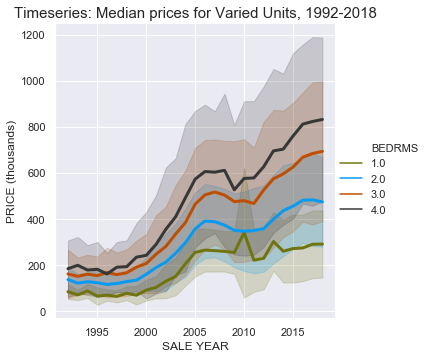

In [53]:
#https://www.programcreek.com/python/example/96204/seaborn.FacetGrid
brdf = finaldf[(finaldf['BEDRMS'] > 0) & (finaldf['BEDRMS'] <= 4)]

#convert date to year
brdf.SALE_DATE = brdf.SALE_DATE.astype("datetime64")

start_date= '01-01-1992'
end_date = '12-31-2018'
mask = (brdf.SALE_DATE >= start_date) & (brdf.SALE_DATE <= end_date)
brdf = brdf.loc[mask]

###
bdf = brdf[['WARD', 'BEDRMS', 'SALE_DATE', 'PRICE']]
SALE_YR = brdf.SALE_DATE.dt.strftime('%Y')
bdf.loc[:, 'SALE_YR'] = SALE_YR
bdf = bdf.drop(['SALE_DATE'], axis=1)

bdf.WARD = bdf.WARD.astype('category')
bdf.SALE_YR = bdf.SALE_YR.astype('int')
bdf.PRICE = bdf.PRICE/1000

#groupby to get median price 
bdf = bdf.groupby(['WARD', 'SALE_YR','BEDRMS'])['PRICE'].median()
bdf = bdf.reset_index(level=['WARD', 'SALE_YR', 'BEDRMS'])

col_list = ['olive', 'azure', 'burnt orange', 'dark grey']
sns.set()
g = sns.relplot(data=bdf, x='SALE_YR', y='PRICE', hue='BEDRMS',
               palette=sns.xkcd_palette(col_list), kind='line', markers=True, ci="sd", linewidth=3)
plt.xlabel('SALE YEAR')
plt.ylabel('PRICE (thousands)')
plt.title("Timeseries: Median prices for Varied Units, 1992-2018" ,size=15)

#### TAKEAWAYS:
* Prices for 4 bedrooms more than quadrupled.
* Prices for 1 and 3 bedrooms nearly tripled.
* Prices for 2 bedrooms nearly doubled.
* The most dramatic growth in real estate occurred from 1996-2006 and 2011-2016.
* There was a decrease in value between 2006 and 2011.

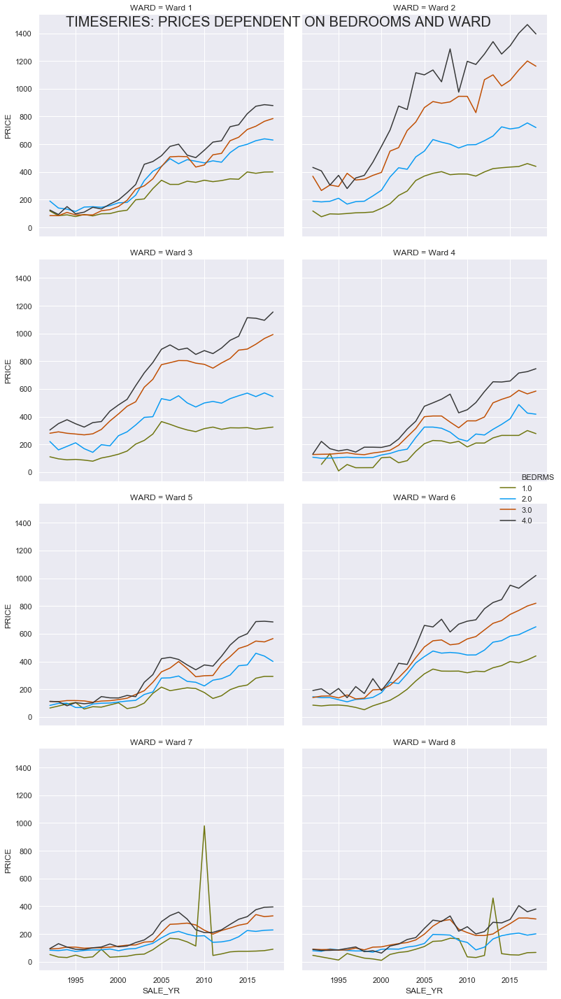

In [54]:
#plot
col_list = ['olive', 'azure', 'burnt orange', 'dark grey']
col_list_palette = sns.xkcd_palette(col_list)
sns.set_palette(col_list_palette)
sns.set()
g = sns.relplot(data=bdf, x='SALE_YR', y='PRICE', col='WARD', col_wrap=2, hue='BEDRMS',
               palette=sns.xkcd_palette(col_list), kind='line', markers=True, ci="sd")
plt.suptitle("TIMESERIES: PRICES DEPENDENT ON BEDROOMS AND WARD", size=20)

plt.tight_layout()

#### TAKEAWAYS:
* WARDS 2 and 3 have the greatest range in property values.
* WARD 7 and 8 consistently have the lowest property values.
* There are some unusual 1 bedroom prices in WARDS 7 and 8 between 2010 and 2013.
* WARD 6 has the most consistent growth in property values between 2008 and 2018.

## Where are the most property sales happening?

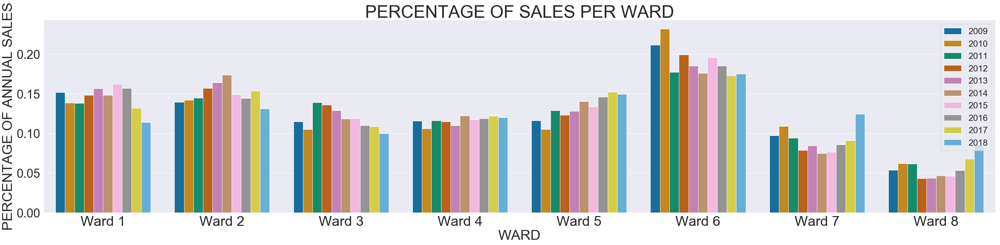

In [55]:
persdf = finaldf[['WARD', 'PRICE', 'SALE_DATE']]

#convert date to year
persdf.SALE_DATE = persdf.SALE_DATE.astype("datetime64")

start_date = '01-01-2009'
end_date = '12-31-2018'
mask = (persdf.SALE_DATE >= start_date) & (persdf.SALE_DATE <= end_date)
persdf = persdf.loc[mask]

SALE_YR = persdf.SALE_DATE.dt.strftime('%Y')
persdf.loc[:, 'SALE_YR'] = SALE_YR
persdf = persdf.drop(['SALE_DATE'], axis=1)

#count of prices
persdf = persdf.groupby(['SALE_YR', 'WARD']).count()

#sums['SUMS'] = counts per year
#tdf['PRICE'] = counts of sales per ward
sums = persdf.sum(level=['SALE_YR'])
sums['SUMS'] = sums['PRICE']
sums = sums.drop(['PRICE'], axis=1)

tdf = persdf.reset_index().merge(sums, how="left", on='SALE_YR').set_index(['SALE_YR', 'WARD'])

#getting percentage of each ward() from totals(SUMS)
PERC_YR = [(tdf.loc[ind,'PRICE'] / tdf.loc[ind, 'SUMS']) for ind, row in tdf.iterrows()]
tdf['PERC_YR']=PERC_YR

tdf.reset_index(level=['SALE_YR', 'WARD'], inplace=True)

sns.set()
plt.figure(figsize=(40,10))
ax = sns.barplot(data=tdf, x='WARD', y='PERC_YR', hue='SALE_YR', palette='colorblind', ci=0)
plt.xticks(size=40)
plt.yticks(size=35)
plt.xlabel('WARD', fontsize=40)
plt.ylabel('PERCENTAGE OF ANNUAL SALES', fontsize=40)
ax.set_title('PERCENTAGE OF SALES PER WARD', fontsize='50')
plt.legend(fontsize=25)
plt.tight_layout()

#### TAKEAWAYS:
* WARDS 7 and 8 have generally had the lowest number of sales, <br> 
but had a very dramatic increase in real estate sales between 2016 and 2018.
* WARD 6 consistently has the highest number of sales.
* WARD 4 consistently maintains about 12% of sales
* WARD 5 has seen a consistent increase in percentage of sales after 2011, <br>
and WARD 3 has seen a consistent decrease in percentage of sales after 2011.

## Is housing affordable for local residents?

Text(0.5, 1.0, '2010-2014 AFFORDABILITY OF 2-BEDROOM SALES')

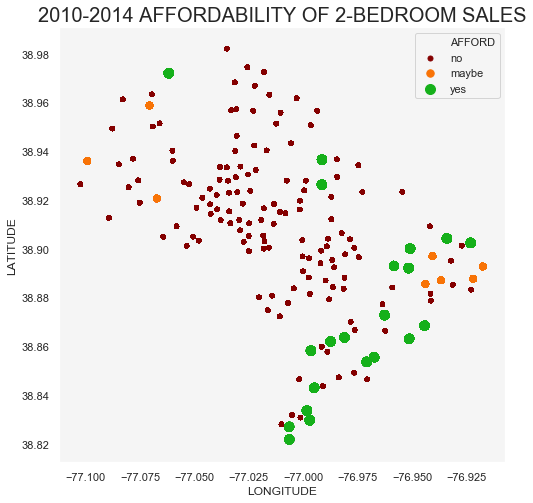

In [56]:
#reference for calculations: https://www.thebalance.com/calculate-mortgage-315668

#Mortgage function:

def mortgage(pricedf, mergedf, fagi):
    for ind, row in pricedf.iterrows():
        n = 12 * 30
        i = .05/12
        d = (((1 + i)**n)-1) / (i*(1+i)**n)
        plow = (pricedf.loc[ind, fagi] * .28 / 12)
        alow = plow * d 
        tlow = alow / .93 
        phigh = (pricedf.loc[ind, fagi] * .32 / 12) 
        ahigh = phigh * d 
        thigh = ahigh / .93 
        if (pricedf.loc[ind, 'PRICE'] > thigh):
            pricedf.loc[ind, 'AFFORD'] = 'no'
        if ((pricedf.loc[ind, 'PRICE'] <= thigh) & (pricedf.loc[ind, 'PRICE'] >= tlow)):
            pricedf.loc[ind, 'AFFORD'] = 'maybe'
        if (pricedf.loc[ind, 'PRICE'] < tlow):
            pricedf.loc[ind, 'AFFORD'] = 'yes'
        pricedf.loc[ind, 'LOW_MORTGAGE'] = plow
        pricedf.loc[ind, 'HIGH_MORTGAGE'] = phigh
    
    pricedf.reset_index(level=0, inplace=True)
    wardf = mergedf[['WARD', 'TRACT']]
    pricedf = pd.merge(pricedf, wardf, on='TRACT', how='left')           
    cataff = pd.api.types.CategoricalDtype(
            categories=["no", "maybe", "yes"], ordered=True)
    pricedf.AFFORD = pricedf.AFFORD.astype(cataff) 
    return pricedf



#mergeddf according to timeframe (first=2010-2014, second=2015-2018)
mergedf.SALE_DATE = pd.to_datetime(mergedf.SALE_DATE)
start_date= '01-01-2010'
end_date = '12-31-2014'
fmask = (mergedf.SALE_DATE >= start_date) & (mergedf.SALE_DATE <= end_date)
fmergedf = mergedf.loc[fmask]

start_date= '01-01-2015'
end_date = '12-31-2018'
smask = (mergedf.SALE_DATE >= start_date) & (mergedf.SALE_DATE <= end_date)
smergedf = mergedf.loc[smask]

fpricedf2 = \
fmergedf[(fmergedf['BEDRMS'] == 2)].groupby('TRACT')[['PRICE', 'LATITUDE', 'LONGITUDE', 'FAGI_MEDIAN_2012']].median()

#apply function
Fpricedf2 = mortgage(fpricedf2, mergedf, 'FAGI_MEDIAN_2012')

#graph
affordlevels = ['dark red', 'orange', 'green']
sns.set_style({'axes.grid' : False}, rc={'axes.facecolor':'whitesmoke'})
plt.figure(figsize=(8,8))
g = sns.scatterplot(data=Fpricedf2, x='LONGITUDE', y='LATITUDE', 
                    hue ='AFFORD', size='AFFORD', sizes=[25, 55, 100], palette=sns.xkcd_palette(affordlevels), **{"alpha":.8}, 
                    edgecolor='none')
g.set_title('2010-2014 AFFORDABILITY OF 2-BEDROOM SALES', size=20)

#### TAKEAWAYS:
* Housing is most affordable for local residents in southeast DC (WARDS 7 and 8)
* Housing is somewhat more affordable for local residents in northwest DC (WARDS 2 and 3).
* Housing is consistently unaffordable in central DC.

# EXPLORATORY DATA ANALYSIS:

In [57]:
collist = list(finaldf.columns)
for i in collist:
    print("The length of %s is %f and type is %s." % (i, len(finaldf[i].unique()), finaldf.dtypes[i]))

The length of PRICE is 12303.000000 and type is float64.
The length of SALE_DATE is 6496.000000 and type is datetime64[ns].
The length of SALE_NUM is 15.000000 and type is float64.
The length of QUALIFIED is 2.000000 and type is category.
The length of QUADRANT is 4.000000 and type is category.
The length of WARD is 8.000000 and type is category.
The length of SQUARE is 3122.000000 and type is category.
The length of NBHD is 56.000000 and type is category.
The length of SUBNBHD is 122.000000 and type is category.
The length of CENSUS_TRACT is 176.000000 and type is int64.
The length of CENSUS_BLOCK is 3614.000000 and type is category.
The length of ZIPCODE is 24.000000 and type is float64.
The length of LATITUDE is 51974.000000 and type is float64.
The length of LONGITUDE is 52140.000000 and type is float64.
The length of X is 3122.000000 and type is float64.
The length of Y is 3122.000000 and type is float64.
The length of STYLE is 18.000000 and type is category.
The length of STRUCT 

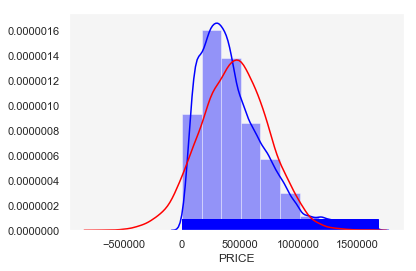

In [58]:
mean = finaldf.PRICE.mean()
sd = finaldf.PRICE.std()

norm = np.random.normal(size=10000, loc=mean, scale=sd)

# would want to do this after means of bootstrapping empirical data. 
# Don't use random sample for the normal distribution because we're using theoretical distribution. 

_ = sns.distplot(finaldf.PRICE, bins=10, rug=True, color='blue')
_ = sns.distplot(norm, hist=False, rug=False, color='red') 

In [59]:
#Shapiro-Wilk Test 
stat, p = stats.shapiro(finaldf.PRICE)
print('Statistic=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0).')
else:
    print('Sample does not look Gaussian (reject H0).')

### D’Agostino’s K^2 Test    
stat, p = stats.normaltest(finaldf.PRICE)
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0).')
else:
    print('Sample does not look Gaussian (reject H0).')


Statistic=0.918, p=0.000
Sample does not look Gaussian (reject H0).
Statistic=16431.376, p=0.000
Sample does not look Gaussian (reject H0).


/Users/Julia/miniconda3/envs/advanced-pip-example/lib/python3.7/site-packages/scipy/stats/morestats.py:1309: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


#### TAKEAWAYS:
- The distribution of our data is not normal.

- We will use the Mann Whitney Wilcoxon test whether the distribution of charges differs for two categorical variables (minimum of 20 observations per category). 
  
- We will use the Kruskal-Wallis H-test to test whether the distribution of charges differ for more than two categorical variables (minimum 5 observations per category).
  
  
- We will use correlation statistics to determine the effect of continuous variables on charges. 
    - Levene’s test of homogeneity of variance
    - If variance is homogeneous, use Pearson correlation coefficient: test for linear relationship
    - If not, use test for monotonic relationship (variables shift in the same direction)
      - Spearman Rank correlation
      - Kendall Tau correlation

In [60]:
finaldf.SALE_DATE = pd.to_datetime(finaldf.SALE_DATE)
price_thousands = finaldf.PRICE / 1000

### SALE_DATE on PRICE:

In [61]:
early = min(finaldf['SALE_DATE'])
times = []
for i in finaldf['SALE_DATE']:
    num = i - early
    times.append(num.total_seconds())

Text(0.5, 1.0, 'Timeseries: Residential Housing Prices')

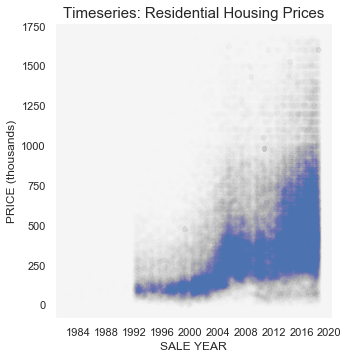

In [62]:
fdf = pd.DataFrame()
fdf['PRICE'] = finaldf['PRICE']
fdf['SALE_DATE'] = finaldf['SALE_DATE']
fdf.PRICE = fdf.PRICE / 1000

sns.relplot(x='SALE_DATE', y='PRICE', kind='scatter', data=fdf, ci='sd', **{'alpha': .005}, edgecolor='none')
plt.xlabel('SALE YEAR')
plt.ylabel('PRICE (thousands)')
plt.title("Timeseries: Residential Housing Prices" ,size=15)

Text(0.5, 1.0, 'Timeseries: Rolling Median Prices')

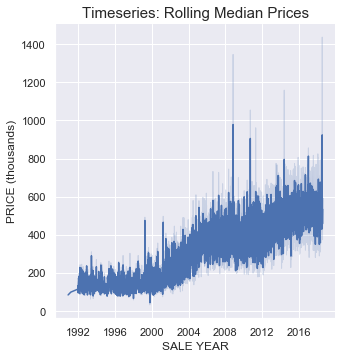

In [63]:
dtdf = finaldf.sort_values(by=(['SALE_DATE']))
rolmed = dtdf['PRICE'].rolling(12).median()
gdf = pd.DataFrame()
gdf['rolmed'] = rolmed
gdf['SALE_DATE'] = dtdf['SALE_DATE']
gdf = gdf.reset_index(drop=True)
gdf.rolmed = gdf.rolmed/1000

sns.set(rc={'figure.figsize':(20,20)})
sns.relplot(x="SALE_DATE", y="rolmed", kind="line", ci="sd", data=gdf)
plt.xlabel('SALE YEAR')
plt.ylabel('PRICE (thousands)')
plt.title("Timeseries: Rolling Median Prices" ,size=15)

Statistic=167954.877, p=0.000
Variance is not homogeneous (reject H0).
The correlation coefficient: 0.470 indicates a moderate monotonic relationship


Text(0, 0.5, 'PRICE IN THOUSANDS')

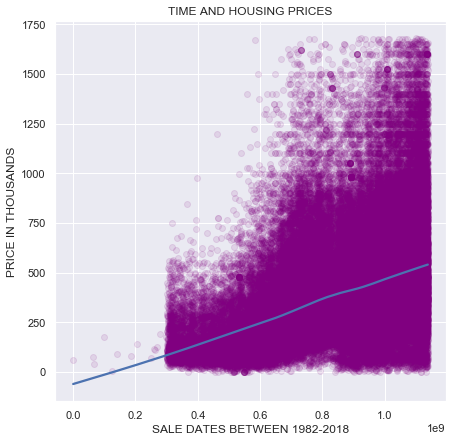

In [64]:
tdf = finaldf.copy()
tdf['TIME'] = times

#Test for homogeneity of variance:
stat, p = stats.levene(tdf['TIME'], tdf['PRICE'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('Variance is homogeneous (fail to reject H0).')
else:
    print('Variance is not homogeneous (reject H0).')
    
#Test for monotonic relationship:
r = tdf['PRICE'].corr(tdf['TIME'], method='spearman')
if r > .7:
    print("The correlation coefficient: %.3f indicates a strong monotonic relationship" % r) 
elif r > .3:
    print("The correlation coefficient: %.3f indicates a moderate monotonic relationship" % r) 
elif r > .1:
    print("The correlation coefficient: %.3f indicates a weak monotonic relationship" % r) 
elif r > -.1:
    print("The correlation coefficient: %.3f indicates a negligible monotonic relationship." % r) 
elif r > -.3:
    print("The correlation coefficient: %.3f indicates a weak monotonic relationship" % r)
elif r > -.7:
    print("The correlation coefficient: %.3f indicates a moderate monotonic relationship" % r) 
else:
    print("The correlation coefficient: %.3f indicates a strong monotonic relationship" % r)
 
plt.figure(figsize=(7, 7))
g = sns.regplot(x=tdf['TIME'], y=price_thousands,lowess=True, \
                 scatter_kws={'alpha':.1, 'color':'purple'}, fit_reg=True)
plt.title('TIME AND HOUSING PRICES')
plt.xlabel('SALE DATES BETWEEN 1982-2018')
plt.ylabel('PRICE IN THOUSANDS')

#### TAKEAWAYS:
* There is a moderate positive linear relationship of time and price. 

### QUALIFIED ON PRICES:

Text(0, 0.5, 'PRICE (THOUSANDS OF USD)')

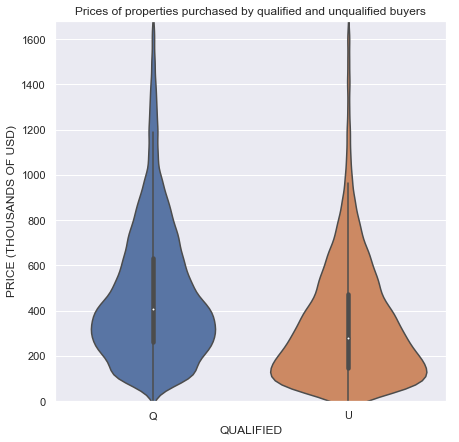

In [65]:
plt.figure(figsize=(7, 7))
g = sns.violinplot(x=finaldf.QUALIFIED, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
plt.title("Prices of properties purchased by qualified and unqualified buyers")
plt.ylabel('PRICE (THOUSANDS OF USD)')

In [66]:
stat, p = stats.mannwhitneyu(finaldf[(finaldf['QUALIFIED']=='Q')]['PRICE'], finaldf[(finaldf['QUALIFIED']=='U')]['PRICE'])
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('The charge distributions are different between groups (fail to reject H0).')
else:
    print('The charge distributions are different between groups (reject H0).')

Statistic=483289132.500, p=0.000
The charge distributions are different between groups (reject H0).


#### TAKEAWAYS:
* Unqualified buyers generally buy lower priced properties
* The range of the value for properties purchased by qualified and unqualified buyers is the same

### QUADRANT AND PRICE

Text(0.5, 1.0, 'Prices of properties in various quadrants')

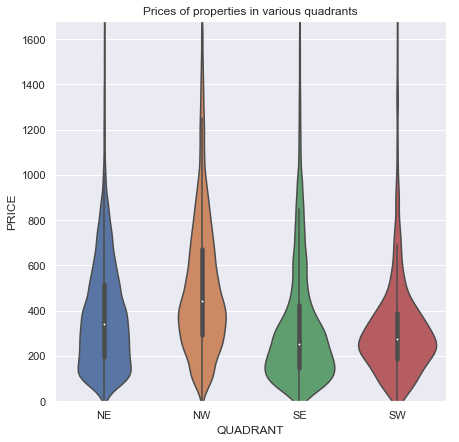

In [67]:
plt.figure(figsize=(7, 7))
g = sns.violinplot(x=finaldf.QUADRANT, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
plt.title("Prices of properties in various quadrants")

In [68]:
#Test for equal distribution:
stat, p = stats.kruskal(finaldf[(finaldf['QUADRANT']=='SE')]['PRICE'], finaldf[(finaldf['QUADRANT']=='SW')]['PRICE'], 
            finaldf[(finaldf['QUADRANT']=='NE')]['PRICE'], finaldf[(finaldf['QUADRANT']=='NW')]['PRICE'])
                        
print('Statistic=%.3f, p=%.3f' % (stat, p))
if p > alpha:
    print('The charge distributions are different between groups (fail to reject H0).')
else:
    print('The charge distributions are different between groups (reject H0).')

Statistic=7559.823, p=0.000
The charge distributions are different between groups (reject H0).


#### TAKEAWAYS:
* Quadrants have an impact on price.
* SE generally has the lowest prices.
* NW generally has the highest prices.
* SW has the the most normal price distribution.

### SUBNEIGHBORHOOD, WARD AND PRICE:

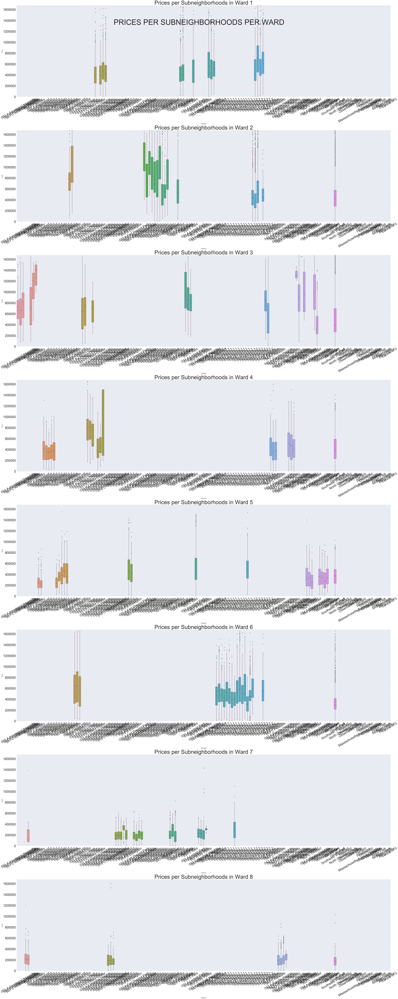

In [69]:
onedf = finaldf[(finaldf['WARD']=='Ward 1')]
twodf = finaldf[(finaldf['WARD']=='Ward 2')]
threedf = finaldf[(finaldf['WARD']=='Ward 3')]
fourdf = finaldf[(finaldf['WARD']=='Ward 4')]
fivedf = finaldf[(finaldf['WARD']=='Ward 5')]
sixdf = finaldf[(finaldf['WARD']=='Ward 6')]
sevendf = finaldf[(finaldf['WARD']=='Ward 7')]
eightdf = finaldf[(finaldf['WARD']=='Ward 8')]

fig, axarr = plt.subplots(8, 1, sharey=True, figsize=(60, 150))
fig.suptitle('PRICES PER SUBNEIGHBORHOODS PER WARD', fontsize=80)   
for i in range(8):
    axarr[i].set_ylim(0, ((max(finaldf.PRICE))+1))
       
zero = sns.boxplot(x='SUBNBHD', y='PRICE', data=onedf, ax=axarr[0], showmeans=True)
axarr[0].set_title("Prices per Subneighborhoods in Ward 1", size=60)             
zero.tick_params(axis= 'x', labelsize=35, rotation=30)
zero.tick_params(axis= 'y', labelsize=35)

one = sns.boxplot(x='SUBNBHD', y='PRICE', data=twodf, ax=axarr[1], showmeans=True)
axarr[1].set_title("Prices per Subneighborhoods in Ward 2", size=60)             
one.tick_params(axis= 'x', labelsize=35, rotation=30)
one.tick_params(axis= 'y', labelsize=35)
                   
two = sns.boxplot(x='SUBNBHD', y='PRICE', data=threedf, ax=axarr[2], showmeans=True)
axarr[2].set_title("Prices per Subneighborhoods in Ward 3", size=60)             
two.tick_params(axis= 'x', labelsize=35, rotation=30)
two.tick_params(axis= 'y', labelsize=35)
                   
three = sns.boxplot(x='SUBNBHD', y='PRICE', data=fourdf, ax=axarr[3], showmeans=True)
axarr[3].set_title("Prices per Subneighborhoods in Ward 4", size=60)             
three.tick_params(axis= 'x', labelsize=35, rotation=30)
three.tick_params(axis= 'y', labelsize=35)
                   
four = sns.boxplot(x='SUBNBHD', y='PRICE', data=fivedf, ax=axarr[4], showmeans=True)
axarr[4].set_title("Prices per Subneighborhoods in Ward 5", size=60)             
four.tick_params(axis= 'x', labelsize=35, rotation=30)
four.tick_params(axis= 'y', labelsize=35)
                   
five = sns.boxplot(x='SUBNBHD', y='PRICE', data=sixdf, ax=axarr[5], showmeans=True)
axarr[5].set_title("Prices per Subneighborhoods in Ward 6", size=60)             
five.tick_params(axis= 'x', labelsize=35, rotation=30)
five.tick_params(axis= 'y', labelsize=35)    

six = sns.boxplot(x='SUBNBHD', y='PRICE', data=sevendf, ax=axarr[6], showmeans=True)
axarr[6].set_title("Prices per Subneighborhoods in Ward 7", size=60)             
six.tick_params(axis= 'x', labelsize=35, rotation=30)
six.tick_params(axis= 'y', labelsize=35)
                   
seven = sns.boxplot(x='SUBNBHD', y='PRICE', data=eightdf, ax=axarr[7], showmeans=True)
axarr[7].set_title("Prices per Subneighborhoods in Ward 8", size=60)             
seven.tick_params(axis= 'x', labelsize=35, rotation=30)
seven.tick_params(axis= 'y', labelsize=35)
    
plt.tight_layout()

#### TAKEAWAYS:
* Wards 7 and 8 have the lowest prices
* Neighborhoods and Subneighborhoods show more explicit differences in price within different wards. 

### STORIES AND PRICE:

Text(0.5, 0, 'STORIES')

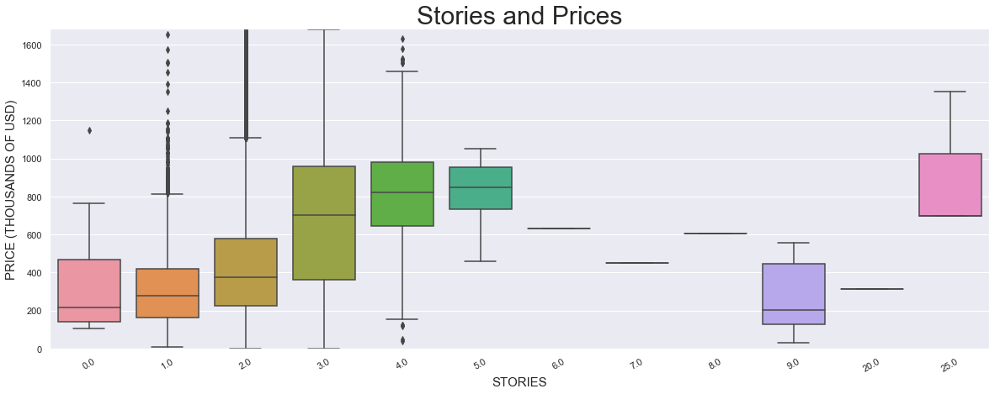

In [70]:
sns.set()
plt.figure(figsize=(20, 7))
g = sns.boxplot(x=finaldf.STORIES, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
g.tick_params(axis='x', rotation=30)
plt.title("Stories and Prices", size=30)
plt.ylabel('PRICE (THOUSANDS OF USD)', size=15)
plt.xlabel('STORIES', size=15)

In [71]:
finaldf.STORIES.value_counts().sort_index()

0.0        11
1.0      1879
2.0     83137
3.0      4557
4.0       139
5.0         8
6.0         1
7.0         1
8.0         1
9.0        14
20.0        1
25.0        3
Name: STORIES, dtype: int64

#### TAKEAWAYS:
* Prices increase with buildings up to five floors.
* We do not know much about the prices for high-rise buildings, as we only have less than 25 samples.

### GRADES AND PRICE:

Text(0.5, 0, 'GRADE')

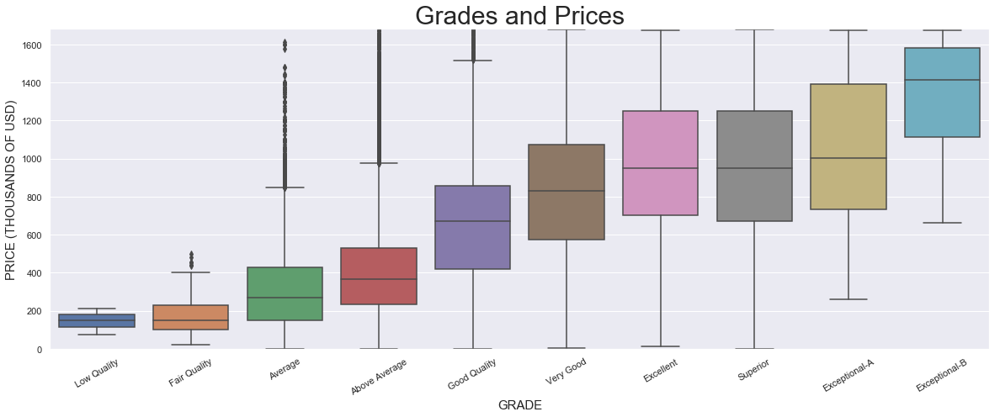

In [72]:
cat_values=pd.api.types.CategoricalDtype(
            categories=['Low Quality', 'Fair Quality', 'Average', 'Above Average', 'Good Quality', \
            'Very Good', 'Excellent', 'Superior', 'Exceptional-A', 'Exceptional-B'], ordered=True)
finaldf.GRADE = finaldf['GRADE'].astype(cat_values)

sns.set()
plt.figure(figsize=(20, 7))
g = sns.boxplot(x=finaldf.GRADE, y=price_thousands)
g.set(ylim=(0, max(price_thousands)))
g.tick_params(axis='x', rotation=30)
plt.title("Grades and Prices", size=30)
plt.ylabel('PRICE (THOUSANDS OF USD)', size=15)
plt.xlabel('GRADE', size=15)

#### TAKEAWAYS:
* GRADE has a very significant impact on price. 
* Price correlates directly with each step in grade.

### ROOMS AND PRICE:

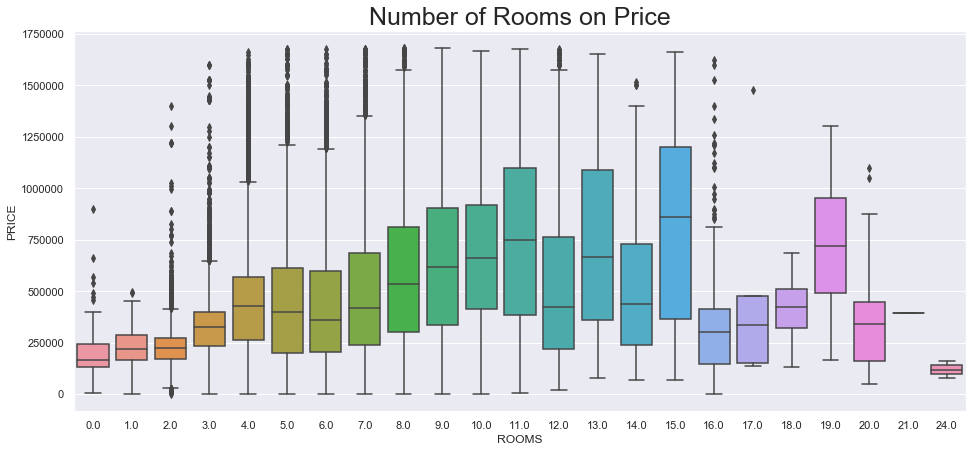

In [73]:
plt.figure(figsize=(16,7))
plt.title('Number of Rooms on Price', size=25)
sns.boxplot(x='ROOMS', y='PRICE', data=finaldf)

In [74]:
#### TAKEAWAYS:
* Prices increase up to 11 rooms

SyntaxError: invalid syntax (<ipython-input-74-54287054610f>, line 2)